In [9]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 30.1 MB/s eta 0:00:00


In [1]:
# 1. Uninstall BOTH libraries completely
!pip uninstall -y kaggle kagglesdk

# 2. Install ONLY the main library
# (This forces it to find the correct matching 'helper' version automatically)
!pip install --upgrade kaggle

print("Clean install complete!")

Found existing installation: kaggle 1.7.4.5
Uninstalling kaggle-1.7.4.5:
  Successfully uninstalled kaggle-1.7.4.5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.4/86.4 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 56.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.0/160.0 kB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.6/13.6 MB 147.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 189.0/189.0 kB 20.8 MB/s eta 0:00:00
Clean install complete!


In [2]:
import os

# 1. Set Token
os.environ['KAGGLE_API_TOKEN'] = 'KGAT_b4c7a941166c9d28010e0bd5e8379109'

# 2. Download
print("Attempting download...")
!kaggle datasets download -d duythanhng/parking-lot-database-for-yolo

# 3. Unzip
!unzip -q parking-lot-database-for-yolo.zip -d /content/dataset
print("Success!")

Attempting download...
Dataset URL: https://www.kaggle.com/datasets/duythanhng/parking-lot-database-for-yolo
License(s): Attribution 4.0 International (CC BY 4.0)
 99% 1.88G/1.91G [00:20<00:00, 127MB/s]
100% 1.91G/1.91G [00:20<00:00, 102MB/s]
Success!


In [3]:
import os
import yaml

# 1. Search for the dataset folders automatically
# (This fixes the "file not found" errors by finding exactly where the unzipper put the files)
dataset_root = '/content/dataset'
found_path = dataset_root # Default

for root, dirs, files in os.walk(dataset_root):
    if 'train' in dirs:
        found_path = root
        break

print(f"Dataset found at: {found_path}")

# 2. Create the data.yaml file
config = {
    'path': found_path,          # The folder we found above
    'train': 'train/images',     # Training images
    'val': 'valid/images',       # Validation images
    'test': 'test/images',       # Test images
    'nc': 2,                     # Number of Classes
    'names': ['space-empty', 'space-occupied'] # Class Names
}

yaml_save_path = os.path.join(found_path, 'data.yaml')
with open(yaml_save_path, 'w') as f:
    yaml.dump(config, f, default_flow_style=False)

print(f"SUCCESS: Config file created at: {yaml_save_path}")

Dataset found at: /content/dataset
SUCCESS: Config file created at: /content/dataset/data.yaml


In [4]:
import os
import yaml

print("🕵️ Searching for the correct image folders...")

# Start at the dataset root
root_dir = '/content/dataset'
train_path = ""
val_path = ""

# 1. Walk through every folder to find 'train' and 'valid'
for dirpath, dirnames, filenames in os.walk(root_dir):
    # Check if this folder is named 'train'
    if os.path.basename(dirpath) == 'train':
        # Check if it has an 'images' subfolder or IS the image folder
        if 'images' in dirnames:
            train_path = os.path.join(dirpath, 'images')
        else:
            train_path = dirpath

    # Check if this folder is named 'valid' or 'val'
    if os.path.basename(dirpath) in ['valid', 'val']:
        if 'images' in dirnames:
            val_path = os.path.join(dirpath, 'images')
        else:
            val_path = dirpath

# 2. Fallback: If 'valid' is missing, look for 'test' or use 'train'
if not val_path:
    print("⚠️ 'valid' folder not found. Checking for 'test'...")
    for dirpath, dirnames, filenames in os.walk(root_dir):
        if os.path.basename(dirpath) == 'test':
             if 'images' in dirnames:
                val_path = os.path.join(dirpath, 'images')
             else:
                val_path = dirpath

    # If still nothing, just use train (This prevents the crash)
    if not val_path:
        print("⚠️ No valid/test found. Using train for both.")
        val_path = train_path

# 3. Stop if we found nothing
if not train_path:
    print("❌ CRITICAL ERROR: Could not find a 'train' folder! Please check your files.")
else:
    print(f"✅ FOUND TRAIN: {train_path}")
    print(f"✅ FOUND VAL:   {val_path}")

    # 4. Generate the config with these EXACT ABSOLUTE paths
    config = {
        'train': train_path,
        'val': val_path,
        'nc': 2,
        'names': ['space-empty', 'space-occupied']
    }

    # Overwrite the old broken file
    with open('/content/dataset/data.yaml', 'w') as f:
        yaml.dump(config, f)

    print("\n🎉 SUCCESS: data.yaml has been fixed! You can run training now.")

🕵️ Searching for the correct image folders...
⚠️ 'valid' folder not found. Checking for 'test'...
⚠️ No valid/test found. Using train for both.
❌ CRITICAL ERROR: Could not find a 'train' folder! Please check your files.


In [5]:
import os
import shutil
import random
import yaml

print("🔧 Re-organizing dataset into standard YOLO format... (This may take 30 seconds)")

# 1. Create a new clean folder for our fixed dataset
base_dir = '/content/dataset_fixed'
# Create train and val folders
for split in ['train', 'val']:
    os.makedirs(os.path.join(base_dir, split, 'images'), exist_ok=True)
    os.makedirs(os.path.join(base_dir, split, 'labels'), exist_ok=True)

# 2. Search and Move files
files_moved = 0
# We scan the original messy folder
for root, _, files in os.walk('/content/dataset'):
    for file in files:
        if file.endswith('.jpg'):
            # check if the matching text label exists
            label_name = file.replace('.jpg', '.txt')
            if label_name in files:
                # Decide: 80% go to Training, 20% go to Validation
                split = 'train' if random.random() < 0.8 else 'val'

                # Copy the image and label to the clean folder
                shutil.copy(os.path.join(root, file), os.path.join(base_dir, split, 'images', file))
                shutil.copy(os.path.join(root, label_name), os.path.join(base_dir, split, 'labels', label_name))
                files_moved += 1

                if files_moved % 500 == 0:
                    print(f"   Processed {files_moved} images...")

if files_moved == 0:
    print("❌ CRITICAL: No matching image/label pairs found! The dataset might be missing .txt files.")
else:
    print(f"✅ SUCCESS: Moved {files_moved} pairs to '{base_dir}'")

    # 3. Create the configuration file for the NEW folder
    config = {
        'path': base_dir,
        'train': 'train/images',
        'val': 'val/images',
        'nc': 2,
        'names': ['space-empty', 'space-occupied']
    }

    with open(os.path.join(base_dir, 'data.yaml'), 'w') as f:
        yaml.dump(config, f)

    print("🎉 Data is ready! Use the code below to train.")

🔧 Re-organizing dataset into standard YOLO format... (This may take 30 seconds)
   Processed 500 images...
   Processed 1000 images...
   Processed 1500 images...
   Processed 2000 images...
   Processed 2500 images...
   Processed 3000 images...
   Processed 3500 images...
   Processed 4000 images...
   Processed 4500 images...
   Processed 5000 images...
   Processed 5500 images...
   Processed 6000 images...
✅ SUCCESS: Moved 6234 pairs to '/content/dataset_fixed'
🎉 Data is ready! Use the code below to train.


In [10]:
from ultralytics import YOLO

# 1. Load Model
model = YOLO('yolov8n.pt')

# 2. Train (Using the FIXED dataset)
print("🚀 Starting Training...")
results = model.train(
    data='/content/dataset_fixed/data.yaml', # Point to the new fixed folder
    epochs=5,
    imgsz=640,
    batch=16
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
🚀 Starting Training...
Ultralytics 8.3.248 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset_fixed/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, in

📊 Displaying Training Graphs from: /content/runs/detect/train


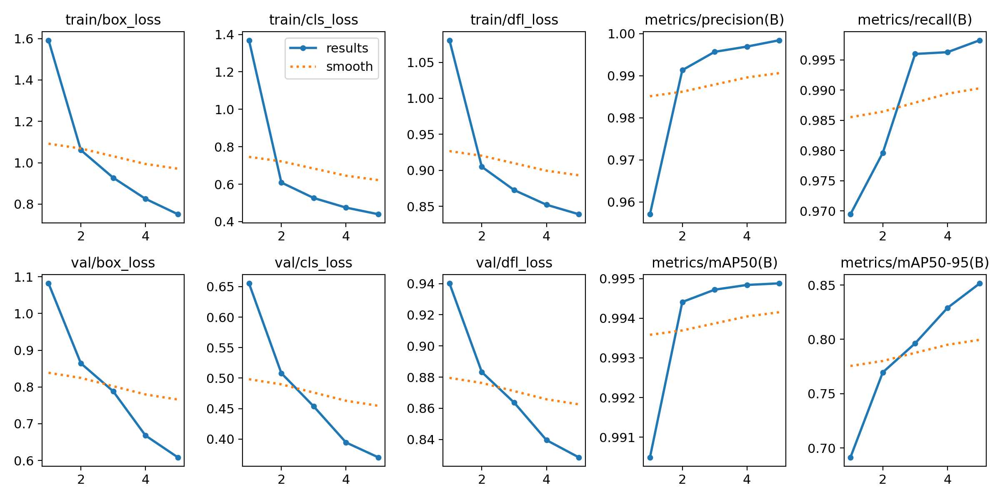

✅ These graphs show how your model improved over 5 epochs.


In [27]:
#Training Graphs
import os
import glob
from IPython.display import Image, display

# 1. Find the latest training folder
train_dirs = glob.glob('/content/runs/detect/train*')
latest_train_dir = max(train_dirs, key=os.path.getmtime)

# 2. Path to the results graph
results_path = os.path.join(latest_train_dir, 'results.png')

# 3. Check if it exists and show it
if os.path.exists(results_path):
    print(f"📊 Displaying Training Graphs from: {latest_train_dir}")
    display(Image(filename=results_path, width=800))
    print("✅ These graphs show how your model improved over 5 epochs.")
else:
    print("❌ Could not find results.png. Did the training finish completely?")

✅ Found latest model at: /content/runs/detect/train/weights/best.pt
👀 Testing on image: 2012-09-20_16_19_40.jpg

image 1/1 /content/dataset_fixed/val/images/2012-09-20_16_19_40.jpg: 384x640 27 space-emptys, 85 space-occupieds, 38.1ms
Speed: 2.3ms preprocess, 38.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/runs/detect/inference

👇 HERE IS YOUR MODEL'S DETECTION:


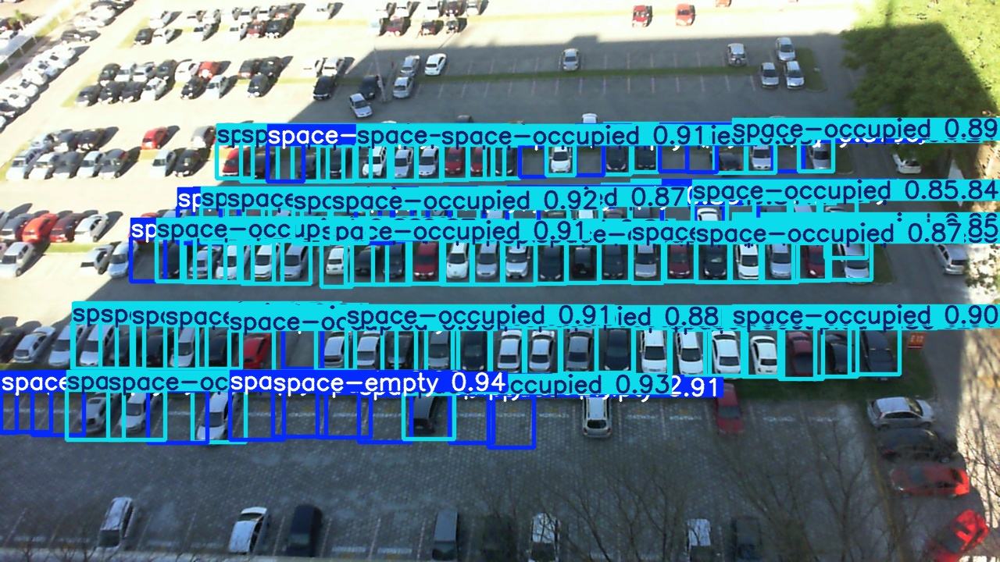

In [14]:
import os
import glob
import random
from ultralytics import YOLO
from IPython.display import Image, display

# --- STEP 1: Find the latest model automatically ---
# Get all folders starting with 'train' in runs/detect/
train_dirs = glob.glob('/content/runs/detect/train*')

# Sort them by time (newest first)
latest_train_dir = max(train_dirs, key=os.path.getmtime)
best_weight_path = os.path.join(latest_train_dir, 'weights', 'best.pt')

print(f"✅ Found latest model at: {best_weight_path}")

# --- STEP 2: Load the model ---
model = YOLO(best_weight_path)

# --- STEP 3: Pick a random image ---
valid_images = glob.glob('/content/dataset_fixed/val/images/*.jpg')
if not valid_images:
    print("❌ Error: No images found in validation folder. Check your dataset path.")
else:
    test_image = random.choice(valid_images)
    print(f"👀 Testing on image: {os.path.basename(test_image)}")

    # --- STEP 4: Predict ---
    # We save to a specific project/name so we know exactly where it goes
    model.predict(source=test_image, save=True, project='/content/runs/detect', name='inference', exist_ok=True, conf=0.25)

    # --- STEP 5: Show Result ---
    # The image is saved in runs/detect/inference/
    result_image_path = os.path.join('/content/runs/detect/inference', os.path.basename(test_image))

    print("\n👇 HERE IS YOUR MODEL'S DETECTION:")
    display(Image(filename=result_image_path, width=600))


image 1/1 /content/dataset_fixed/val/images/2013-04-10_17_35_13.jpg: 384x640 10 space-emptys, 30 space-occupieds, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/runs/detect/predict
🚗 DETECTED OCCUPIED SPOTS: 30
🆓 DETECTED EMPTY SPOTS:    10


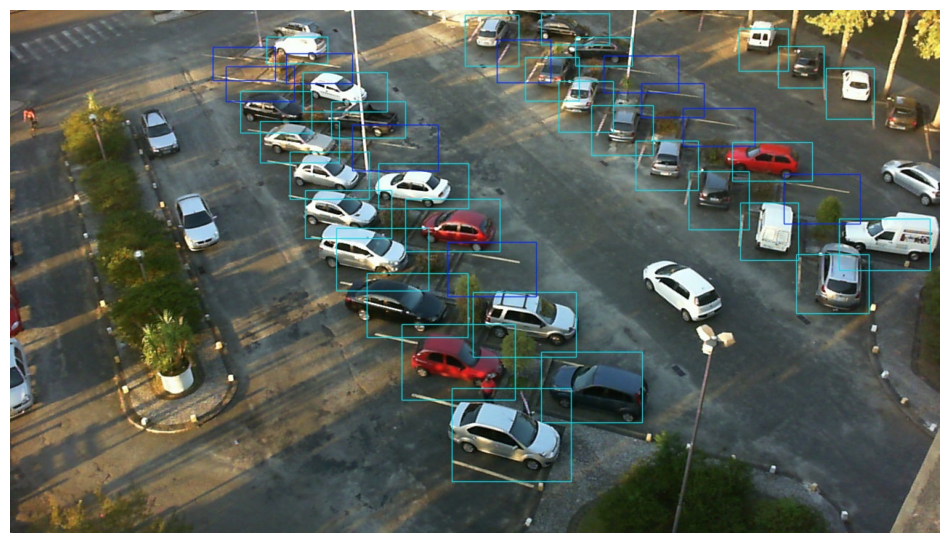

In [15]:
import os
import glob
import random
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# 1. Find the latest model again (just to be safe)
train_dirs = glob.glob('/content/runs/detect/train*')
latest_train_dir = max(train_dirs, key=os.path.getmtime)
best_weight_path = os.path.join(latest_train_dir, 'weights', 'best.pt')
model = YOLO(best_weight_path)

# 2. Pick a random image
valid_images = glob.glob('/content/dataset_fixed/val/images/*.jpg')
test_image = random.choice(valid_images)

# 3. Predict with "Clean" settings
# conf=0.25 : Only show detections if model is 25% sure
# line_width=1 : Make boxes THIN so they don't overlap
# show_labels=False : Hide the messy text to see the cars clearly
results = model.predict(source=test_image, save=True, conf=0.25, line_width=1, show_labels=False, show_conf=False)

# 4. Count the results manually for the presentation
boxes = results[0].boxes
num_empty = 0
num_occupied = 0

# (In your dataset: 0 = empty, 1 = occupied)
for cls in boxes.cls:
    if int(cls) == 0:
        num_empty += 1
    else:
        num_occupied += 1

print("="*40)
print(f"🚗 DETECTED OCCUPIED SPOTS: {num_occupied}")
print(f"🆓 DETECTED EMPTY SPOTS:    {num_empty}")
print("="*40)

# 5. Show the clean image using Matplotlib (Better quality than 'display')
# We load the saved result image
predict_dirs = glob.glob('/content/runs/detect/predict*')
latest_predict_folder = max(predict_dirs, key=os.path.getmtime)
result_image_path = os.path.join(latest_predict_folder, os.path.basename(test_image))

img = cv2.imread(result_image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Fix colors for display

plt.figure(figsize=(12, 8))
plt.imshow(img)
plt.axis('off')
plt.show()

In [17]:
import cv2
import glob
import numpy as np
from ultralytics import YOLO
from IPython.display import HTML
from base64 import b64encode
import os

# 1. Load Model
# (Automatically finds the latest best model)
train_dirs = glob.glob('/content/runs/detect/train*')
latest_train_dir = max(train_dirs, key=os.path.getmtime)
best_weight_path = os.path.join(latest_train_dir, 'weights', 'best.pt')
model = YOLO(best_weight_path)

print(f"🎥 Generating Video using model: {best_weight_path}...")

# 2. Get a sequence of images
# We sort them so they play in order (like a time-lapse)
image_paths = sorted(glob.glob('/content/dataset_fixed/val/images/*.jpg'))[:50] # Take first 50 frames

if not image_paths:
    print("❌ Error: No images found!")
else:
    # Get image dimensions from the first image
    frame = cv2.imread(image_paths[0])
    height, width, layers = frame.shape

    # 3. Initialize Video Writer
    # We save as 'output.mp4'
    out_path = '/content/parking_simulation.mp4'
    # 'mp4v' is a standard codec
    out = cv2.VideoWriter(out_path, cv2.VideoWriter_fourcc(*'mp4v'), 2, (width, height))

    print("🚀 Processing frames... (This might take a minute)")

    for path in image_paths:
        # Run YOLO inference
        # show_labels=False makes it cleaner
        results = model.predict(path, conf=0.25, verbose=False)

        # Draw the boxes on the image
        # line_width=1 makes the boxes thin and neat
        annotated_frame = results[0].plot(line_width=1, font_size=1, labels=False)

        # Add to video
        out.write(annotated_frame)

    out.release()
    print("✅ Video created successfully!")

    # 4. Display Video in Colab
    # We need to compress it slightly for the browser to play it smoothly
    compressed_path = "/content/parking_demo_browser.mp4"
    os.system(f"ffmpeg -i {out_path} -vcodec libx264 {compressed_path}")

    mp4 = open(compressed_path,'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

    print("\n👇 REAL TIME ACTION BELOW:")
    display(HTML(f"""
    <video width=600 controls autoplay loop>
          <source src="{data_url}" type="video/mp4">
    </video>
    """))

🎥 Generating Video using model: /content/runs/detect/train/weights/best.pt...
🚀 Processing frames... (This might take a minute)
✅ Video created successfully!

👇 REAL TIME ACTION BELOW:


🧠 Model loaded: /content/runs/detect/train/weights/best.pt
👉 Enter the filename again (e.g., test.jpg): extra.jpg
🕵️‍♂️ Hunting for cars with LOW confidence settings...

image 1/1 /content/extra.jpg: 736x1280 34 space-emptys, 38.3ms
Speed: 4.3ms preprocess, 38.3ms inference, 1.3ms postprocess per image at shape (1, 3, 736, 1280)
Results saved to /content/runs/detect/predict9

👇 Low Confidence Result:


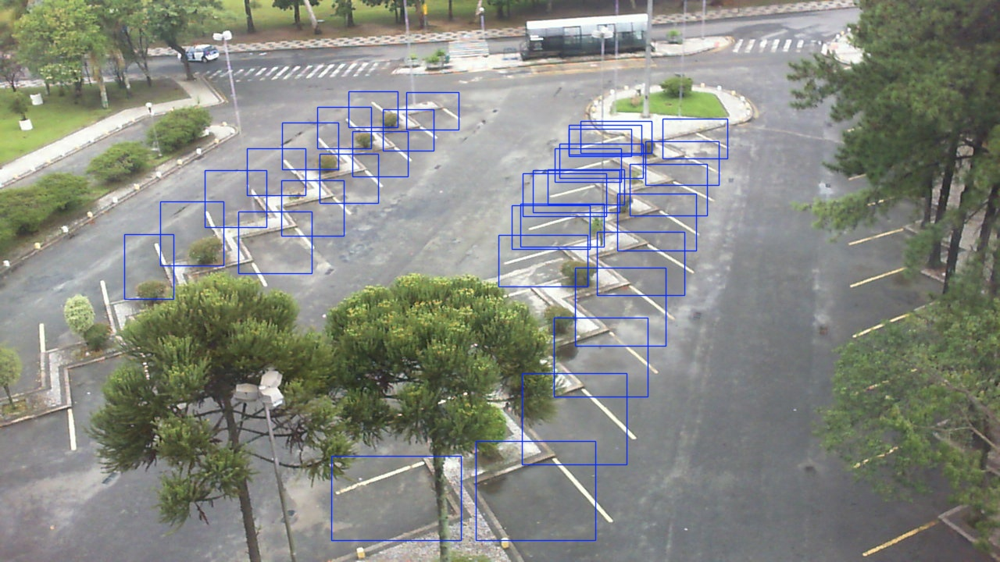

In [26]:
#Custom images

import os
import glob
from ultralytics import YOLO
from IPython.display import Image, display

# 1. Load the model
train_dirs = glob.glob('/content/runs/detect/train*')
latest_train_dir = max(train_dirs, key=os.path.getmtime)
best_weight_path = os.path.join(latest_train_dir, 'weights', 'best.pt')
model = YOLO(best_weight_path)

print(f"🧠 Model loaded: {best_weight_path}")

# 2. Input your filename
filename = input("👉 Enter the filename again (e.g., test.jpg): ")
file_path = f"/content/{filename}"

if os.path.exists(file_path):
    print("🕵️‍♂️ Hunting for cars with LOW confidence settings...")

    # CHANGE 1: conf=0.1 (Detect even if only 10% sure)
    # CHANGE 2: imgsz=1280 (Zoom in to see details better)
    results = model.predict(source=file_path, save=True, conf=0.10, imgsz=1280, line_width=1, show_labels=False)

    # Show result
    predict_dirs = glob.glob('/content/runs/detect/predict*')
    latest_predict = max(predict_dirs, key=os.path.getmtime)
    result_path = os.path.join(latest_predict, filename)

    print("\n👇 Low Confidence Result:")
    display(Image(filename=result_path, width=600))
else:
    print("❌ File not found.")

In [ ]:
#Custom Videos to test

import os
import cv2
import glob
from ultralytics import YOLO
from IPython.display import HTML, display
from base64 import b64encode

# 1. Load the trained model
train_dirs = glob.glob('/content/runs/detect/train*')
latest_train_dir = max(train_dirs, key=os.path.getmtime)
best_weight_path = os.path.join(latest_train_dir, 'weights', 'best.pt')
model = YOLO(best_weight_path)

print(f"🧠 Model loaded from: {best_weight_path}")

# 2. Ask user for the filename
filename = input("👉 Enter the name of your VIDEO file (e.g., parking.mp4): ")
file_path = f"/content/{filename}"

if not os.path.exists(file_path):
    print("❌ Error: File not found! Please upload it to the Files tab first.")
else:
    print("🎥 Processing Video... (This may take a minute)")

    output_path = f"/content/output_{filename}"

    # Process video frame by frame
    cap = cv2.VideoCapture(file_path)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    # Resize large videos to speed up processing
    if width > 1280:
        scale = 1280 / width
        width = 1280
        height = int(height * scale)

    out = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret: break

        # Resize frame if needed
        if frame.shape[1] > 1280:
            frame = cv2.resize(frame, (width, height))

        # Run AI detection
        results = model.predict(frame, conf=0.25, verbose=False)
        annotated_frame = results[0].plot(line_width=2, font_size=1, labels=False)
        out.write(annotated_frame)

        frame_count += 1
        if frame_count % 30 == 0: print(f"   Processed {frame_count} frames...")

    cap.release()
    out.release()
    print("✅ Done! Video saved.")

    # Compress for browser display
    print("⏳ Optimizing for browser playback...")
    compressed_path = "/content/browser_video.mp4"
    os.system(f"ffmpeg -i {output_path} -vcodec libx264 -crf 28 {compressed_path}")

    mp4 = open(compressed_path,'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

    print("\n👇 WATCH YOUR VIDEO RESULT:")
    display(HTML(f"""
    <video width=600 controls autoplay loop>
          <source src="{data_url}" type="video/mp4">
    </video>
    """))